# Multimodal Neural Network

```
     __
    (__)_
    (____)_
    (______)
...//(  00 )\......version 1.0
```

In [8]:
%load_ext autoreload
%autoreload 2
# Python Standard Libraries
from datetime import datetime
import glob
import itertools
import math
import os
import random
import re
import time
import warnings
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# Deep Learning libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset

# Other libraries
# ~ Scientific
import numpy as np
import scipy.stats as st
# ~ Image manipulation / visualisation
import imgaug
from imgaug import augmenters as iaa
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import skimage
import skimage.io as skio
import skimage.transform as sktr
# ~ Other
from tqdm.notebook import tqdm

# Local libraries
from utils.image import *
from utils.plotting import *
from utils.torch import *

# IPython
from IPython.display import clear_output, HTML

# Path to Zurich dataset:
ZURICH = "../zurich"
# Download at: https://drive.google.com/file/d/0B9xP9Y5JKJz0ay1HdG4tRm1mME0/view?usp=sharing

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
count = torch.cuda.device_count()
print(f"{count} GPU device(s) available.")
print()
print("List of GPUs:")
for i in range(count):
    print(f"* {torch.cuda.get_device_name(i)}")

1 GPU device(s) available.

List of GPUs:
* TITAN Xp


In [3]:
###### METHOD RELATED
# The place where the models will be saved
export_folder = "results" # Add this path to the .gitignore
# The number of channels in the latent space (best is 1 or 3 for visualization)
latent_channels = 3
# Modality slicing
# You can choose a set of channels per modality (RGB for instance)
# Modality A
modA = slice(0, 3)
modA_name = "RGB"
modA_len = modA.stop - modA.start
# Modality B
modB = slice(3, 4)
modB_name = "NIR"
modB_len = modB.stop - modB.start
# Distance function
simfunctions = {
    "euclidean" : lambda x, y: -torch.norm(x - y, p=2, dim=1).mean(),
    "L1"        : lambda x, y: -torch.norm(x - y, p=1, dim=1).mean(),
    "huber"     : lambda x, y: -torch.sqrt(1 + (x - y).pow(2)).mean(),
    "MSE"       : lambda x, y: -(x - y).pow(2).mean(),
    "L3"        : lambda x, y: -torch.norm(x - y, p=3, dim=1).mean(),
    "Linf"      : lambda x, y: -torch.norm(x - y, p=float("inf"), dim=1).mean(),
    "soft_corr" : lambda x, y: F.softplus(x*y).sum(axis=1),
    "corr"      : lambda x, y: (x*y).sum(axis=1),
    "cosine"    : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).mean(),
    "angular"   : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).acos().mean() / math.pi,
}
sim_func = simfunctions["MSE"]
# Temperature (tau) of the loss
tau =  .1
# L1/L2 activation regularization
act_l1 = 0
act_l2 = 0
# p4 Equivariance (should always be True, unless you want to see how everything breaks visually otherwise)
equivariance = False
# Create video (slightly slower training)
video = False
video_path = export_folder

# DEEP LEARNING RELATED
# Device to train on (inference is done on cpu)
device = "cuda" if torch.cuda.is_available() else "cpu"
# Use two GPUs?
device1 = device2 = device # 1 gpu for 2 modalities
#device1, device2 = "cuda:0", "cuda:1" # 1 gpu per modality
# Arguments for the tiramisu neural network
tiramisu_args = {
    # Number of convolutional filters for the first convolution
    "init_conv_filters": 16,
    # Number and depth of down blocks
    "down_blocks": (2, 2, 2),
    # Number and depth of up blocks
    "up_blocks": (2, 2, 2),
    # Number of dense layers in the bottleneck
    "bottleneck_layers": 3,
    # Upsampling type of layer (upsample has no grid artefacts)
    "upsampling_type": "upsample",
    # Type of max pooling, blurpool has better shift-invariance
    "transition_pooling": "max",
    # Dropout rate for the convolution
    "dropout_rate": 0.0,
    # Early maxpooling to reduce the input size
    "early_transition": False,
    # Activation function at the last layer
    "activation_func": None,
    # How much the conv layers should be compressed? (Memory saving)
    "compression": 1.0,
    # Memory efficient version of the tiramisu network (trades memory for computes)
    # Gains of memory are enormous compared to the speed decrease.
    # See: https://arxiv.org/pdf/1707.06990.pdf
    "efficient": False,
}
# Epochs
epochs = 5
# Batch size
batch_size = 24
# Steps per epoch
steps_per_epoch = 32
# Number of steps
steps = steps_per_epoch * epochs
# How many unique patches are fed duriing one epoch
samples_per_epoch = steps_per_epoch * batch_size
# Optimiser
#from lars.lars import LARS
#optimiser = LARS
optimiser = optim.Adam
# Optimizer arguments
opt_args = {
    "lr": 1e-3,
    "weight_decay": 1e-4,
    #"momentum": 0.9
}
# Gradient norm. (limit on how big the gradients can get)
grad_norm = 1.0

# DATASET RELATED
def worker_init_fn(worker_id):
    base_seed = int(torch.randint(2**32, (1,)).item())
    lib_seed = (base_seed + worker_id) % (2**32)
    imgaug.seed(lib_seed)
    np.random.seed(lib_seed)

dataloader_args = {
    "batch_size": batch_size,
    "shuffle": False,
    "num_workers": 16,
    "pin_memory": True,
    "worker_init_fn": worker_init_fn,
}

In [4]:
if not os.path.exists(export_folder):
    os.makedirs(export_folder)
    print("Created export folder!")
if video:
    paths = ["videos/similarity", "videos/latentspaces"]
    for path in paths:
        fpath = os.path.join(video_path, path)
        if os.path.exists(fpath):
            continue
        os.makedirs(fpath)
        print(f"Created {fpath} folder!")

In [9]:
class ZurichDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.path = folder_path
        self.image_paths = sorted(glob.glob(folder_path))
        self.transform = transform
        # Preloading the dataset in the RAM
        self.images = []
        for i in range(len(self.image_paths)):
            img = skio.imread(self.image_paths[i])
            img = (img / 2**12).astype(np.float32) # 12-bit data
            self.images.append(img)

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        return self.get(idx)

    def get(self, idx, augment=True):
        if augment and self.transform:
            return self.transform(self.images[idx])
        return self.images[idx]

## Hyper-parameters / Settings

In [21]:
class ImgAugTransform:
    def __init__(self, testing=False):
        if not testing:
            self.aug = iaa.Sequential([
                iaa.CropToFixedSize(128,128),
                iaa.Fliplr(0.5),
                iaa.Affine(rotate=(-180, 180), order=[0, 1, 3], mode="symmetric"),
                iaa.Sometimes(0.2, iaa.OneOf([
                    iaa.AdditiveGaussianNoise(loc=0, scale=(0., 0.05)),
                    iaa.GaussianBlur(sigma=(0, 1.0)),
                    iaa.EdgeDetect(alpha=1.0),
                    iaa.CoarseDropout(0.1, size_percent=0.05, per_channel=True),
                ])),
                iaa.Multiply((0.9, 1.1), per_channel=0.3),
            ])
        else:
            self.aug = iaa.Sequential([
                iaa.CropToFixedSize(128,128),
            ])

    def __call__(self, img):
        img = np.array(img)
        return self.aug.augment_image(img)

dset = ZurichDataset(ZURICH + "/images/zh10.tif", transform=ImgAugTransform())
dset_test = ZurichDataset(ZURICH + "/images/zh12.tif", transform=ImgAugTransform(testing=True))
train_loader = torch.utils.data.DataLoader(
    dset,
    sampler=OverSampler(dset, samples_per_epoch),
    **dataloader_args
)
test_loader = torch.utils.data.DataLoader(
    dset_test,
    sampler=OverSampler(dset_test, samples_per_epoch),
    **dataloader_args
)

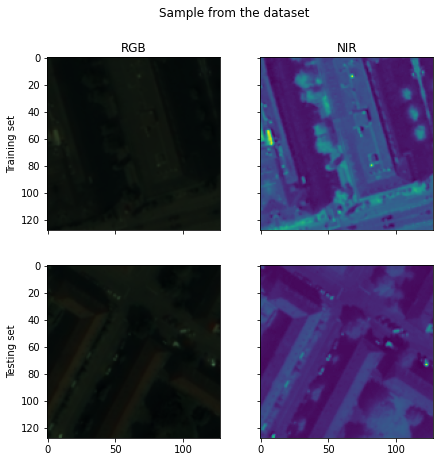

In [22]:
#imgaug.seed(0)
idx = 0 # Img to display
fig, ax = plt.subplots(2, 2, figsize=(7, 7), sharex=True, sharey=True)
fig.suptitle("Sample from the dataset")
ax[0, 0].set_title(modA_name)
ax[0, 0].set_ylabel("Training set")
sample = dset[idx]
ax[0, 0].imshow(mode2img(sample, modA))
ax[0, 1].set_title(modB_name)
ax[0, 1].imshow(mode2img(sample, modB))
ax[1, 0].set_ylabel("Testing set")
sample = dset_test[idx]
ax[1, 0].imshow(mode2img(sample, modA))
ax[1, 1].imshow(mode2img(sample, modB))

plt.show()

## Training

In [23]:
from models.tiramisu import DenseUNet

class ModNet(DenseUNet):
    def __init__(self, **args):
        super(ModNet, self).__init__(**args, include_top=False)
        out_channels = self.get_channels_count()[-1]
        self.final_conv = torch.nn.Conv2d(out_channels, latent_channels, 1, bias=False)

    def forward(self, x):
        # Penultimate layer
        L_hat = super(ModNet, self).forward(x)
        # Final convolution
        return self.final_conv(L_hat)

torch.manual_seed(0)
modelA = ModNet(in_channels=modA_len, nb_classes=latent_channels, **tiramisu_args).to(device1)
modelB = ModNet(in_channels=modB_len, nb_classes=latent_channels, **tiramisu_args).to(device2)

optimizerA = optimiser(modelA.parameters(), **opt_args)
optimizerB = optimiser(modelB.parameters(), **opt_args)

print("*** MODEL A ***")
modelA.summary()

*** MODEL A ***
Model ModNet has 111 layers.
-> Total number of parameters: 165064
-> Trainable parameters:       165064
-> Non-trainable parameters:   0
Uncompressed size of the weights: 0.7MB


In [24]:
def compute_pairwise_loss(Ls, similarity_fn, tau=1.0, device=None):
    """Computation of the final loss.
    
    Args:
        Ls (list): the latent spaces.
        similarity_fn (func): the similarity function between two datapoints x and y.
        tau (float): the temperature to apply to the similarities.
        device (str): the torch device to store the data and perform the computations.
    
    Returns (list of float):
        softmaxes: the loss for each positive sample (length=2N, with N=batch size).
        similarities: the similarity matrix with all pairwise similarities (2N, 2N)

    Note:
        This implementation works in the case where only 2 modalities are of
        interest (M=2). Please refer to the paper for the full algorithm.
    """
    # Computation of the similarity matrix
    # The matrix contains the pairwise similarities between each sample of the full batch
    # and each modalities.
    points = torch.cat([L.to(device) for L in Ls])
    N = batch_size
    similarities = torch.zeros(2*N, 2*N).to(device)
    for i in range(2*N):
        for j in range(i+1):
            s = similarity_fn(points[i], points[j])/tau
            similarities[i, j] = s
            similarities[j, i] = s

    # Computation of the loss, one row after the other.
    irange = np.arange(2*N)
    softmaxes = torch.empty(2*N).to(device)
    for i in range(2*N):
        j = (i + N) % (2 * N)
        pos = similarities[i, j]
        # The negative examples are all the remaining points
        # excluding self-similarity
        neg = similarities[i][irange != i]
        softmaxes[i] = -pos + torch.logsumexp(neg, dim=0)
    return softmaxes, similarities

def test():
    """Runs the model on the test data."""
    modelA.eval()
    modelB.eval()
    test_loss = []
    with torch.no_grad():
        for batch_idx, data in enumerate(test_loader):
            data = data.permute(0, 3, 1, 2)
            dataA = data[:, modA].float().to(device1)
            dataB = data[:, modB].float().to(device2)
            L1 = modelA(dataA)
            L2 = modelB(dataB)

            softmaxes, similarities = compute_pairwise_loss(
                [L1, L2],
                similarity_fn=sim_func,
                tau=tau,
                device=device1
            )
            loss_test = softmaxes.mean()

            if act_l1 > 0.:
                loss_test += act_l1 * activation_decay([L1, L2], p=1, device=device1)
            if act_l2 > 0.:
                loss_test += act_l2 * activation_decay([L1, L2], p=2, device=device1)
            test_loss.append(loss_test.item())
    losses["test"].append(np.mean(test_loss))

    # Video creation if necessary
    if video:
        with torch.no_grad():
            imgaug.seed(0)
            batch = np.stack([dset[i] for i in range(batch_size)]).transpose(0, 3, 1, 2)
            tbatchA = torch.tensor(batch[:, modA]).float().to(device1)
            tbatchB = torch.tensor(batch[:, modB]).float().to(device2)

            L1 = modelA(tbatchA)
            L2 = modelB(tbatchB)

            # Saving the latent spaces
            idx = 0
            fig = plot_input_latent(tbatchA[idx], tbatchB[idx], L1[idx], L2[idx])
            plt.savefig(os.path.join(export_folder, f"videos/latentspaces/{epoch:03d}.png"))
            plt.close(fig)
            # Saving the similarity matrix
            _, similarities = compute_pairwise_loss(
                [L1, L2],
                similarity_fn=sim_func,
                tau=tau,
                device=device1
            )
            fig = plt.figure(figsize=(5, 5))
            plot_similarity_matrix(similarities, "Similarity matrix (test set)")
            plt.savefig(os.path.join(export_folder, f"videos/similarity/{epoch:03d}.png"))
            plt.close(fig)

    return loss_test, similarities

In [ ]:
import time
start = time.time()

modelA = modelA.to(device1)
modelB = modelB.to(device2)
torch.manual_seed(0)

losses = {"train": [], "test": []}
epoch = 0
test() # First round of testing
for epoch in range(1, epochs+1):
    modelA.train()
    modelB.train()
    for batch_idx, data in enumerate(train_loader):
        # Preparing the batch
        data = data.permute(0, 3, 1, 2)
        dataA = data[:, modA].float().to(device1)
        dataB = data[:, modB].float().to(device2)
        # Reseting the optimizer (gradients set to zero)
        optimizerA.zero_grad()
        optimizerB.zero_grad()

        if equivariance:
            # Applies random 90 degrees rotations to the data (group p4)
            # This step enforces the formula of equivariance: d(f(T(x)), T^{-1}(f(x)))
            # With f(x) the neural network, T(x) a transformation, T^{-1}(x) the inverse transformation
            random_rotA = np.random.randint(4, size=batch_size)
            random_rotB = np.random.randint(4, size=batch_size)
            dataA_p4 = batch_rotate_p4(dataA, random_rotA, device1)
            dataB_p4 = batch_rotate_p4(dataB, random_rotB, device2)

            # Compute the forward pass
            L1 = modelA(dataA_p4)
            L2 = modelB(dataB_p4)

            # Applies the inverse of the 90 degree rotation to recover the right positions
            L1_ungrouped = batch_rotate_p4(L1, -random_rotA, device1)
            L2_ungrouped = batch_rotate_p4(L2, -random_rotB, device2)
        else:
            L1_ungrouped = modelA(dataA)
            L2_ungrouped = modelB(dataB)

        # Computes the loss
        loss = compute_pairwise_loss(
            [L1_ungrouped, L2_ungrouped],
            similarity_fn=sim_func,
            tau=tau,
            device=device1
        )[0].mean()

        # Activation regularization
        if act_l1 > 0.:
            loss += act_l1 * activation_decay([L1, L2], p=1., device=device1)
        if act_l2 > 0.:
            loss += act_l2 * activation_decay([L1, L2], p=2., device=device1)

        # Computing the gradients
        loss.backward()

        # Clipping the the gradients if they are too big
        torch.nn.utils.clip_grad_norm_(modelA.parameters(), grad_norm)
        torch.nn.utils.clip_grad_norm_(modelB.parameters(), grad_norm)
        # Performing the gradient descent
        optimizerA.step()
        optimizerB.step()

        losses["train"].append(loss.item())
        clear_output(wait=True)
        plot_losses(losses, steps, steps_per_epoch)
        plt.show()

    # Testing after each epoch
    _, similarities = test()
    clear_output(wait=True)
    plot_losses(losses, steps, steps_per_epoch)
    plt.show()

modelA.eval();
modelB.eval();

duration = time.time() - start
print(duration)

In [ ]:
date = datetime.now().strftime("%Y%d%m_%H%M%S")
model_path = os.path.join(export_folder, f"model_{date}.pt")
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    torch.save({
        "modelA": modelA,
        "modelB": modelB,
    }, model_path)
print(f"model saved as: {model_path}")
HTML(f'<a href="{model_path}" title="{model_path}" download target="_blank" style="text-decoration:none">🤖 Download model 🤖</a>')

## Sanity check of the training

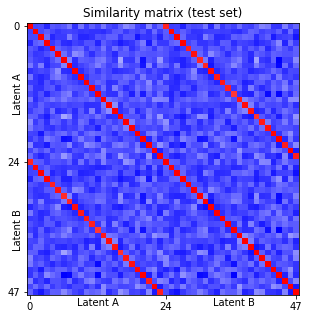

In [524]:
plt.figure(figsize=(5, 5))
plot_similarity_matrix(similarities, "Similarity matrix (test set)")
plt.show()

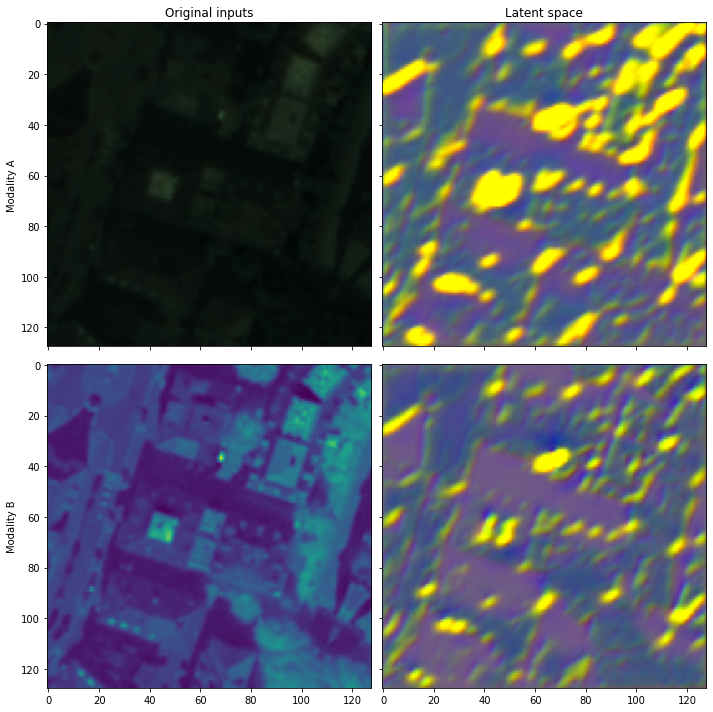

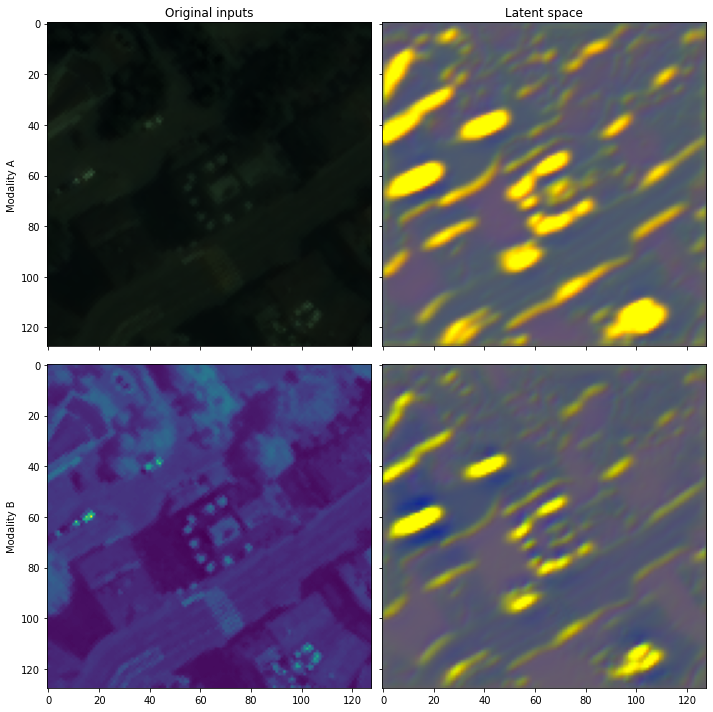

In [507]:
L1 = modelA.to("cpu")(dataA.to("cpu"))
L2 = modelB.to("cpu")(dataB.to("cpu"))

# Example id (can range from 0 to batch_size)
for b in range(2):
    plot_input_latent(dataA[b], dataB[b], L1[b], L2[b])
    plt.savefig(os.path.join(export_folder, f"latentspace{b:0>2d}.png"))

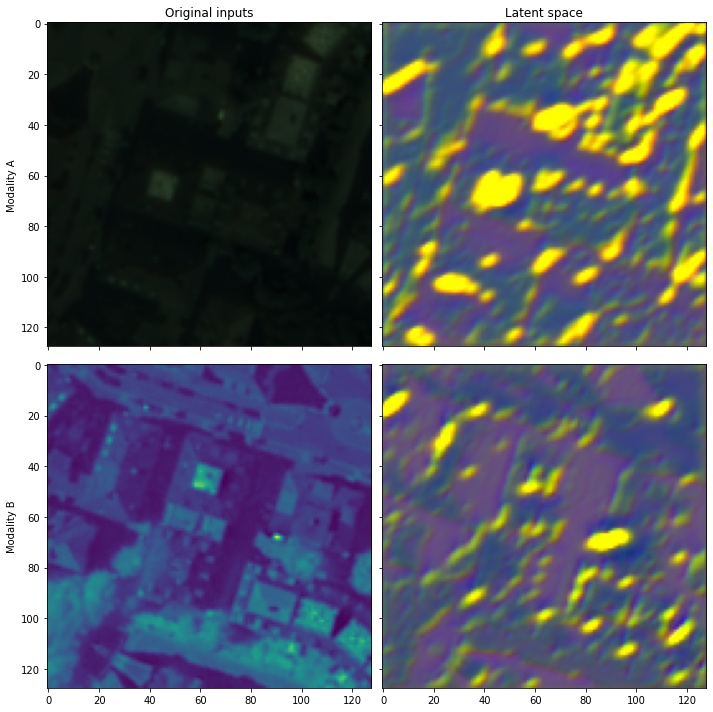

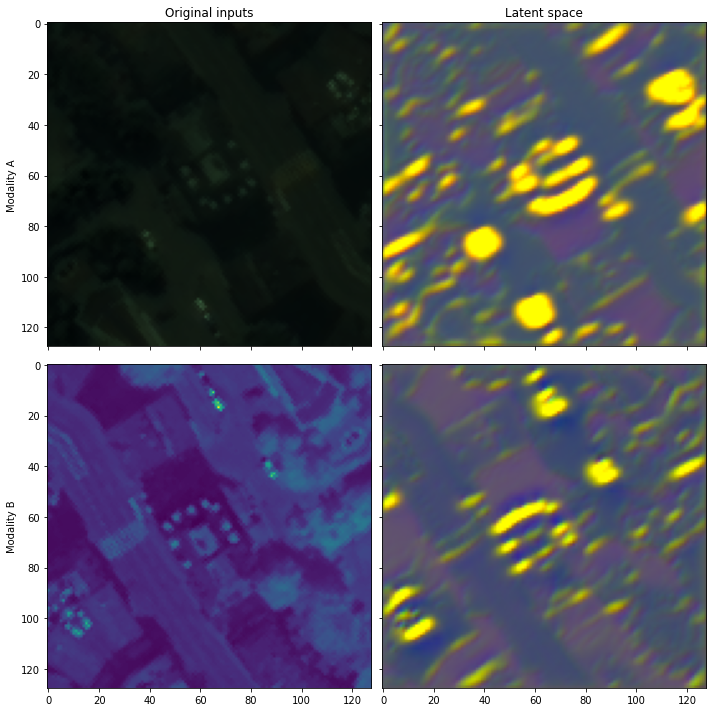

In [508]:
random_rotA = np.random.randint(4, size=batch_size)
random_rotB = np.random.randint(4, size=batch_size)
dataA_p4 = batch_rotate_p4(dataA, random_rotA, device1)
dataB_p4 = batch_rotate_p4(dataB, random_rotB, device2)
L1 = modelA.to("cpu")(dataA_p4.to("cpu"))
L2 = modelB.to("cpu")(dataB_p4.to("cpu"))

# Example id (can range from 0 to batch_size)
for b in range(2):
    plot_input_latent(dataA_p4[b], dataB_p4[b], L1[b], L2[b])
    plt.savefig(os.path.join(export_folder, f"latentspace{b:0>2d}.png"))

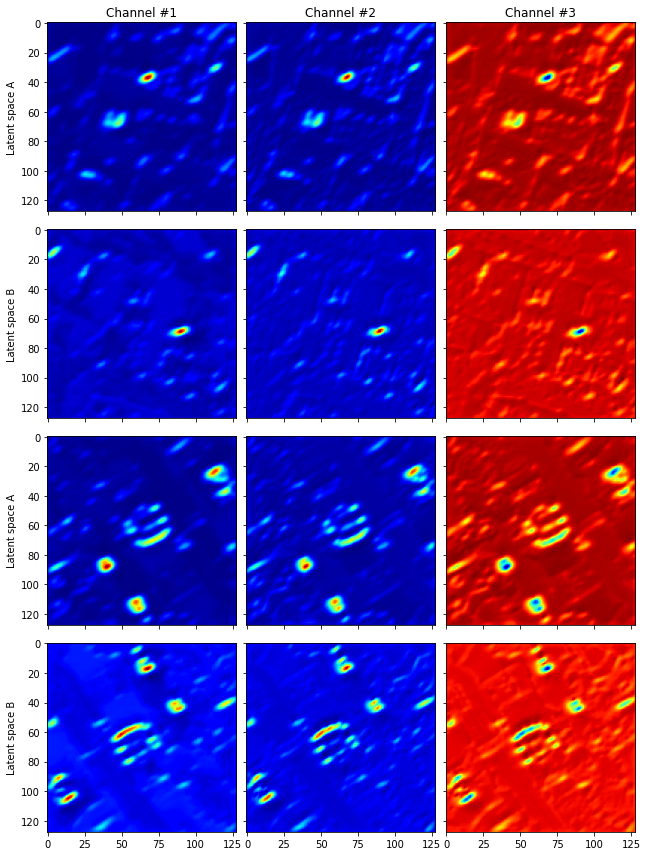

In [509]:
N = 2 # must be between 1 and batch_size

cmap = "jet"
fig, ax = plt.subplots(2*N, latent_channels, sharex=True, sharey=True, figsize=(latent_channels*3, 2*N*3))
for i in range(N):
    for j in range(latent_channels):
        if i == 0:
            ax[i, j].set_title(f"Channel #{j+1}")
        if j == 0:
            ax[i*2+0, j].set_ylabel("Latent space A")
            ax[i*2+1, j].set_ylabel("Latent space B")
        ax[i*2+0, j].imshow(tensor2np(L1[i, j]), cmap=cmap)
        ax[i*2+1, j].imshow(tensor2np(L2[i, j]), cmap=cmap)
plt.tight_layout()
plt.show()

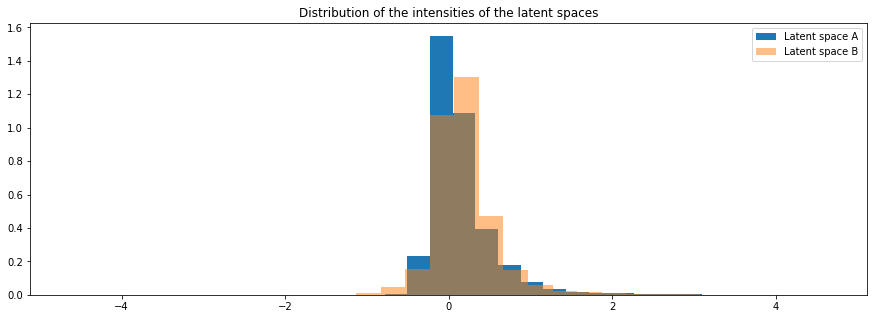

In [178]:
plt.figure(figsize=(15, 5))
plt.title("Distribution of the intensities of the latent spaces")
_, bins1, _ = plt.hist(tensor2np(L1).ravel(), density=True, bins=20, label="Latent space A")
_, bins2, _ = plt.hist(tensor2np(L2).ravel(), density=True, bins=20, alpha=0.5, label="Latent space B")
posmax = max(abs(bins1.min()), abs(bins2.min()), bins1.max(), bins2.max())
plt.xlim(-1.05*posmax, 1.05*posmax)
plt.legend()
plt.show()

## Checking the registration

In [26]:
# Models available in the release file
model = torch.load("models/model_zurich_rot90_disabled.pt")
modelA = model["modelA"].cpu()
modelA.eval()
modelB = model["modelB"].cpu()
modelB.eval();

model90 = torch.load("models/model_zurich_rot90_enabled.pt")
modelA90 = model90["modelA"].cpu()
modelA90.eval()
modelB90 = model90["modelB"].cpu()
modelB90.eval();

In [27]:
def extract_patch(img, x, y, w, h):
    return img[y-h//2:y+h//2, x-w//2:x+w//2]

def get_patch(img, patch_x, patch_y, patch_rot, patch_w = 128, patch_h = 128, interpolation=3):
    max_patch_w = int(np.ceil(np.sqrt(2) * patch_w))
    max_patch_h = int(np.ceil(np.sqrt(2) * patch_h))

    unrotated_patch = extract_patch(img, patch_x, patch_y, max_patch_w, max_patch_h)
    rotated_patch = sktr.rotate(unrotated_patch, patch_rot, order=interpolation)
    final_rotated_patch = extract_patch(rotated_patch, max_patch_w//2, max_patch_h//2, patch_w, patch_h)
    return final_rotated_patch

img = skio.imread(ZURICH + "/images/zh12.tif")
img = (img / 2**12).astype(np.float32)

In [28]:
def weighted_mean(x, w):
    return np.sum(w * x) / np.sum(w)

def weighted_std(x, w):
    return np.sqrt(np.sum(w * (x - weighted_mean(x, w))**2) / np.sum(w))

def weighted_corrcoef(a, b, w):
    return weighted_mean((a - weighted_mean(a, w))*(b - weighted_mean(b, w)), w)/(weighted_std(a, w)*weighted_std(b, w))

In [13]:
# This part pregenerates the correlation for plotting in the video below.
import matplotlib.lines as lines

aa = 16 # Antialiasing for the mask
mx, my = np.mgrid[-1:1:2/128/aa, -1:1:2/128/aa]
mask = (mx**2 + my**2)<1
mask = sktr.rescale(mask, 1/aa, anti_aliasing=True, anti_aliasing_sigma=1)
maskRGB = np.repeat(mask[..., np.newaxis], 3, axis=-1)

patchA = get_patch(img[..., modA], 610, 150, 0)
patchB = get_patch(img[..., modB], 610, 150, 0)
dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
L1_0ang = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
L2_0ang = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)

L1_0ang90 = modelA90(dataA).detach().numpy()[0].transpose(1, 2, 0)
L2_0ang90 = modelB90(dataB).detach().numpy()[0].transpose(1, 2, 0)

norot_L1 = []
norot_L2 = []
rot90_L1 = []
rot90_L2 = []
for angle in tqdm(range(360)):
    patchA = get_patch(img[..., modA], 610, 150, angle)
    patchB = get_patch(img[..., modB], 610, 150, angle)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1 = sktr.rotate(L1, -angle, order=3)
    L2 = sktr.rotate(L2, -angle, order=3)
    norot_L1.append(weighted_corrcoef(L1_0ang.ravel(), L1.ravel(), maskRGB.ravel()))
    norot_L2.append(weighted_corrcoef(L2_0ang.ravel(), L2.ravel(), maskRGB.ravel()))

    L1 = modelA90(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB90(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1 = sktr.rotate(L1, -angle, order=3)
    L2 = sktr.rotate(L2, -angle, order=3)
    rot90_L1.append(weighted_corrcoef(L1_0ang90.ravel(), L1.ravel(), maskRGB.ravel()))
    rot90_L2.append(weighted_corrcoef(L2_0ang90.ravel(), L2.ravel(), maskRGB.ravel()))
    #break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


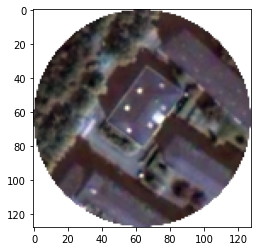

In [14]:
patchRGB = np.concatenate([patchA[..., i:i+1] for i in [2,1,0]], axis=-1)
patchRGB -= np.percentile(patchRGB.reshape(-1, 3), 0.01, axis=0)
patchRGB /= np.percentile(patchRGB.reshape(-1, 3), 99.9, axis=0)
patchRGB = np.concatenate([patchRGB, mask[..., np.newaxis]], axis=-1)
plt.imshow(patchRGB)

In [16]:
# Generates each frames for a figure of the paper
import matplotlib.lines as lines
import matplotlib as mpl
import matplotlib.collections as coll
plt.rcParams.update({'font.size': 13})

aa = 8 # Antialiasing for the mask
mx, my = np.mgrid[-1:1:2/128/aa, -1:1:2/128/aa]
mask = (mx**2 + my**2)<1
mask = sktr.rescale(mask, 1/aa, anti_aliasing=True, anti_aliasing_sigma=1)

def lineToSegments(x, y):
    segments = np.array([x, y]).T.reshape(-1, 1, 2)
    return np.concatenate([segments[:-1], segments[1:]], axis=1)

for angle in tqdm(range(360)):
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    patchRGB = np.concatenate([patchA[..., i:i+1] for i in [2,1,0]], axis=-1)
    patchRGB -= np.percentile(patchRGB.reshape(-1, 3), 0.01, axis=0)
    patchRGB /= np.percentile(patchRGB.reshape(-1, 3), 99.9, axis=0)
    patchRGB = np.concatenate([np.clip(patchRGB, 0, 1.), mask[..., np.newaxis]], axis=-1)

    fig, ax = plt.subplots(2, 5, figsize=(12, 5), dpi=300)
    # polar
    gs = ax[0, 3].get_gridspec()
    for a in ax[:, 3:].ravel():
        a.remove()
    axbig = fig.add_subplot(gs[:, 3:], polar=True)
    # Get the color
    N = 360
    #cycler = mpl.rcParams['axes.prop_cycle'][0]
    cm = np.array(mpl.colors.to_rgba('#1f77b4'))
    c = np.repeat(cm[np.newaxis], N, axis=0)
    transparency = np.minimum(np.linspace(0, 1, N)**2 + .1, 1.0)
    c[:, 3] = np.roll(transparency, angle)
    # Plot the results
    x = np.linspace(0, 2*np.pi, N)
    lc1 = coll.LineCollection(lineToSegments(x, np.abs(norot_L1)), colors=c)
    axbig.add_artist(lc1)
    cm = np.array(mpl.colors.to_rgba('#ff7f0e'))
    c = np.repeat(cm[np.newaxis], N, axis=0)
    c[:, 3] = np.roll(transparency, angle)
    # Plot the results
    x = np.linspace(0, 2*np.pi, N)
    lc2 = coll.LineCollection(lineToSegments(x, np.abs(rot90_L1)), colors=c)
    axbig.add_artist(lc2)
    axbig.set_ylim(0, 1.1)
    axbig.set_title(f"Correlation $\\left[\\rho\\right]_+$ between\nCoMIR$_{{\\theta=0\\degree}}$ and CoMIR$_{{\\theta={angle:3d}\\degree}}$")
    axbig.axes.spines['polar'].set_visible(False)

    cm = plt.get_cmap("viridis")
    patchNIR = cm(patchB[...,0] / 0.2)
    patchNIR[..., -1] = mask
    ax[0, 0].imshow(patchRGB, vmin=0, vmax=1)
    ax[0, 0].axis("off")
    ax[1, 0].imshow(patchNIR, vmin=0, vmax=1)
    ax[1, 0].axis("off")
    #line = lines.Line2D([64, 64+np.cos(-angle*np.pi/180)*64], [64, 64+np.sin(-angle*np.pi/180)*64], lw=1, color='white', axes=ax[0, 0])
    #ax[0, 0].add_line(line)
    ax[0, 0].arrow(64, 64, np.cos(-angle*np.pi/180)*64, np.sin(-angle*np.pi/180)*64, color="white", width=2, clip_on=False, length_includes_head=True)
    ax[1, 0].arrow(64, 64, np.cos(-angle*np.pi/180)*64, np.sin(-angle*np.pi/180)*64, color="white", width=2, clip_on=False, length_includes_head=True)

    patchA = get_patch(img[..., modA], 610, 150, angle)
    patchB = get_patch(img[..., modB], 610, 150, angle)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1 = sktr.rotate(L1, -angle, order=3)
    L2 = sktr.rotate(L2, -angle, order=3)

    minint, maxint = min(L1.min(), L2.min()), max(L1.max(), L2.max())
    L1n, L2n = normalize_common(L1, L2)
    L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
    L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
    ax[0, 1].imshow(L1n, vmin=0, vmax=1)
    ax[0, 1].axis("off")
    circle1 = plt.Circle((63.5, 63.5), 64, color="#1f77b4", linewidth=4, fill=False, clip_on=False)
    ax[0, 1].add_artist(circle1)
    ax[1, 1].imshow(L2n, vmin=0, vmax=1)
    ax[1, 1].axis("off")

    L1 = modelA90(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB90(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1 = sktr.rotate(L1, -angle, order=3)
    L2 = sktr.rotate(L2, -angle, order=3)

    minint, maxint = min(L1.min(), L2.min()), max(L1.max(), L2.max())
    L1n, L2n = normalize_common(L1, L2)
    L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
    L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
    ax[0, 2].imshow(L1n, vmin=0, vmax=1)
    ax[0, 2].axis("off")
    circle1 = plt.Circle((63.5, 63.5), 64, color="#ff7f0e", linewidth=4, fill=False, clip_on=False)
    ax[0, 2].add_artist(circle1)
    ax[1, 2].imshow(L2n, vmin=0, vmax=1)
    ax[1, 2].axis("off")

    ax[0, 0].set_title("Input images")
    ax[0, 1].set_title("CoMIR\n$\\mathcal{C}_4$ disabled")
    ax[0, 2].set_title("CoMIR\n$\\mathcal{C}_4$ enabled")
    
    ax[0, 0].text(-15, 64, "RGB", fontsize="large", rotation=90, va="center")
    ax[1, 0].text(-15, 64, "NIR", fontsize="large", rotation=90, va="center")
    plt.tight_layout()

    plt.subplots_adjust(0.0, 0.0, 0.9, 0.9, 0.05, 0.05)
    plt.savefig(f"results/videos/rot90/frame{angle:03d}.png", bbox_inches='tight', pad_inches=0.10)
    plt.close(fig)
    #break

In [ ]:
# Generating the video above is done with ffmpeg:
#> ffmpeg -framerate 36 -i rot90/frame%03d.png -r 30 -pix_fmt yuv420p -filter:v "crop=in_w-1:in_h-1" rotation.mp4

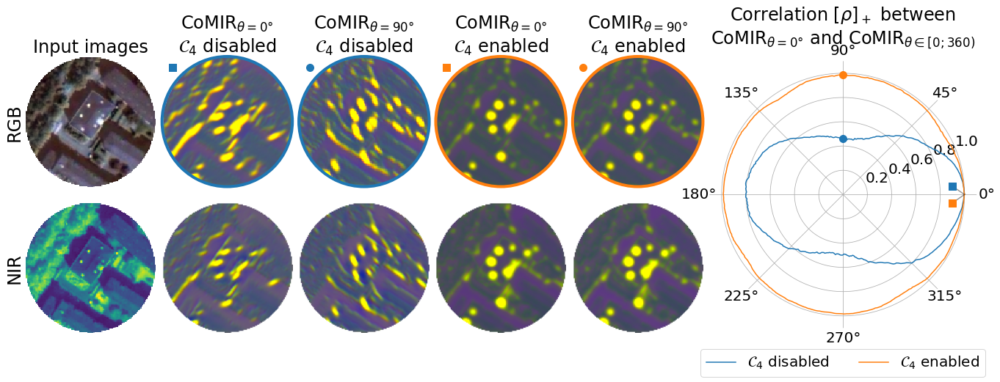

In [18]:
# Generates the figure (associated to the video generated in the previous cell) appearing in the paper
import matplotlib.lines as lines
plt.rcParams.update({'font.size': 20})

aa = 8 # Antialiasing for the mask
mx, my = np.mgrid[-1:1:2/128/aa, -1:1:2/128/aa]
mask = (mx**2 + my**2)<1
mask = sktr.rescale(mask, 1/aa, anti_aliasing=True, anti_aliasing_sigma=1)

def lineToSegments(x, y):
    segments = np.array([x, y]).T.reshape(-1, 1, 2)
    return np.concatenate([segments[:-1], segments[1:]], axis=1)

patchA = get_patch(img[..., modA], 610, 150, 0)
patchB = get_patch(img[..., modB], 610, 150, 0)
patchA90 = get_patch(img[..., modA], 610, 150, 90)
patchB90 = get_patch(img[..., modB], 610, 150, 90)

patchRGB = np.concatenate([patchA[..., i:i+1] for i in [2,1,0]], axis=-1)
patchRGB -= np.percentile(patchRGB.reshape(-1, 3), 0.01, axis=0)
patchRGB /= np.percentile(patchRGB.reshape(-1, 3), 99.9, axis=0)
patchRGB = np.concatenate([np.clip(patchRGB, 0, 1.), mask[..., np.newaxis]], axis=-1)

angle = 90
fig, ax = plt.subplots(2, 7, figsize=(20, 6))
# polar
gs = ax[0, 5].get_gridspec()
for a in ax[:, 5:].ravel():
    a.remove()
axbig = fig.add_subplot(gs[:, 5:], polar=True)
# Get the color
N = 360
#cycler = mpl.rcParams['axes.prop_cycle'][0]
cm = np.array(mpl.colors.to_rgba('#1f77b4'))
c = np.repeat(cm[np.newaxis], N, axis=0)
# Plot the results
x = np.linspace(0, 2*np.pi, N)
axbig.plot(x, np.abs(norot_L1), color=cm, label="$\\mathcal{C}_4$ disabled")
cm = np.array(mpl.colors.to_rgba('#ff7f0e'))
c = np.repeat(cm[np.newaxis], N, axis=0)
# Plot the results
x = np.linspace(0, 2*np.pi, N)
axbig.plot(x, np.abs(rot90_L1), color=cm, label="$\\mathcal{C}_4$ enabled")
axbig.set_ylim(0, 1.1)
axbig.set_title("Correlation $\\left[\\rho\\right]_+$ between\nCoMIR$_{{\\theta=0\\degree}}$ and CoMIR$_{\\theta \\in [0; 360)}$")
marker_size = 100
axbig.scatter([np.pi/40], [.9], zorder=3, c="#1f77b4", marker="s", s=marker_size)
axbig.scatter([np.pi/2], [np.abs(norot_L1)[90]], zorder=3, c="#1f77b4", s=marker_size)
axbig.scatter([-np.pi/40], [.9], zorder=3, c="#ff7f0e", marker="s", s=marker_size)
axbig.scatter([np.pi/2], [np.abs(rot90_L1)[90]], zorder=3, c="#ff7f0e", s=marker_size)
axbig.plot([np.pi/40, 0, -np.pi/40], [.9, 1., .9], c="k", alpha=0.4)
axbig.axes.spines['polar'].set_visible(False)
axbig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)

cm = plt.get_cmap("viridis")
patchNIR = cm(patchB[...,0] / 0.2)
patchNIR[..., -1] = mask
ax[0, 0].imshow(patchRGB, vmin=0, vmax=1, interpolation="nearest")
ax[0, 0].axis("off")
ax[1, 0].imshow(patchNIR, vmin=0, vmax=1, interpolation="nearest")
ax[1, 0].axis("off")

dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
dataA90 = torch.tensor(patchA90[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
dataB90 = torch.tensor(patchB90[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)

L190 = modelA(dataA90).detach().numpy()[0].transpose(1, 2, 0)
L290 = modelB(dataB90).detach().numpy()[0].transpose(1, 2, 0)
L190 = sktr.rotate(L190, -angle, order=3)
L290 = sktr.rotate(L290, -angle, order=3)

L1n, L2n = normalize_common(L1, L2)
L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
ax[0, 1].imshow(L1n, vmin=0, vmax=1)
ax[0, 1].axis("off")
ax[0, 1].scatter([10], [10], c="#1f77b4", marker="s", s=marker_size)
circle1 = plt.Circle((63.5, 63.5), 64, color="#1f77b4", linewidth=4, fill=False, clip_on=False)
ax[0, 1].add_artist(circle1)
ax[1, 1].imshow(L2n, vmin=0, vmax=1)
ax[1, 1].axis("off")
L1n, L2n = normalize_common(L190, L290)
L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
ax[0, 2].imshow(L1n, vmin=0, vmax=1, interpolation="nearest")
ax[0, 2].axis("off")
circle1 = plt.Circle((63.5, 63.5), 64, color="#1f77b4", linewidth=4, fill=False, clip_on=False)
ax[0, 2].add_artist(circle1)
ax[0, 2].scatter([10], [10], c="#1f77b4", s=marker_size)
ax[1, 2].imshow(L2n, vmin=0, vmax=1)
ax[1, 2].axis("off")
L1 = modelA90(dataA).detach().numpy()[0].transpose(1, 2, 0)
L2 = modelB90(dataB).detach().numpy()[0].transpose(1, 2, 0)

L190 = modelA90(dataA90).detach().numpy()[0].transpose(1, 2, 0)
L290 = modelB90(dataB90).detach().numpy()[0].transpose(1, 2, 0)
L190 = sktr.rotate(L190, -angle, order=3)
L290 = sktr.rotate(L290, -angle, order=3)

L1n, L2n = normalize_common(L1, L2)
L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
ax[0, 3].imshow(L1n, vmin=0, vmax=1)
ax[0, 3].axis("off")
circle2 = plt.Circle((63.5, 63.5), 64, color="#ff7f0e", linewidth=4, fill=False, clip_on=False)
ax[0, 3].add_artist(circle2)
ax[0, 3].scatter([10], [10], c="#ff7f0e", marker="s", s=marker_size)
ax[1, 3].imshow(L2n, vmin=0, vmax=1)
ax[1, 3].axis("off")
L1n, L2n = normalize_common(L190, L290)
L1n = np.concatenate([L1n, mask[..., np.newaxis]], axis=-1)
L2n = np.concatenate([L2n, mask[..., np.newaxis]], axis=-1)
ax[0, 4].imshow(L1n, vmin=0, vmax=1)
ax[0, 4].axis("off")
circle2 = plt.Circle((63.5, 63.5), 64, color="#ff7f0e", linewidth=4, fill=False, clip_on=False)
ax[0, 4].add_artist(circle2)
ax[0, 4].scatter([10], [10], c="#ff7f0e", s=marker_size)
ax[1, 4].imshow(L2n, vmin=0, vmax=1)
ax[1, 4].axis("off")

ax[0, 0].set_title("Input images")
ax[0, 1].set_title("CoMIR$_{\\theta=0\\degree}$\n$\\mathcal{C}_4$ disabled")
ax[0, 2].set_title("CoMIR$_{\\theta=90\\degree}$\n$\\mathcal{C}_4$ disabled")
ax[0, 3].set_title("CoMIR$_{\\theta=0\\degree}$\n$\\mathcal{C}_4$ enabled")
ax[0, 4].set_title("CoMIR$_{\\theta=90\\degree}$\n$\\mathcal{C}_4$ enabled")

ax[0, 0].text(-20, 64, "RGB", fontsize="large", rotation=90, va="center")
ax[1, 0].text(-20, 64, "NIR", fontsize="large", rotation=90, va="center")
#plt.tight_layout()

#plt.subplots_adjust(0.125, 0.1, 0.9, 0.9, 0.2, 0.2)
plt.subplots_adjust(0.0, 0.0, 0.9, 0.9, 0.05, 0.05)
plt.savefig(f"results/rot_equivariance.pdf", bbox_inches='tight', pad_inches=0.0)

# Testing the differrent tau configurations

In [461]:
# !!! IMPORTANT !!!
# This needs to be re-run every time to test the different losses:
simfuncname = "mse"
#simfuncname = "cosine"
#simfuncname = "corr"

###### METHOD RELATED
# The place where the models will be saved
export_folder = "results" # Add this path to the .gitignore
# The number of channels in the latent space (best is 1 or 3 for visualization)
latent_channels = 3
# Modality slicing
# You can choose a set of channels per modality (RGB for instance)
# Modality A
modA = slice(0, 3)
modA_name = "RGB"
modA_len = modA.stop - modA.start
# Modality B
modB = slice(3, 4)
modB_name = "NIF"
modB_len = modB.stop - modB.start
# Distance function
simfunctions = {
    "euclidean" : lambda x, y: -torch.norm(x - y, p=2, dim=1).mean(),
    "L1"        : lambda x, y: -torch.norm(x - y, p=1, dim=1).mean(),
    "huber"     : lambda x, y: -torch.sqrt(1 + (x - y).pow(2)).mean(),
    "mse"       : lambda x, y: -(x - y).pow(2).mean(),
    "L3"        : lambda x, y: -torch.norm(x - y, p=3, dim=1).mean(),
    "Linf"      : lambda x, y: -torch.norm(x - y, p=float("inf"), dim=1).mean(),
    "soft_corr" : lambda x, y: F.softplus(x*y).sum(axis=1).mean(),
    "corr"      : lambda x, y: (x*y).sum(axis=1).mean(),
    "cosine"    : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).mean(),
    "angular"   : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).acos().mean() / math.pi,
}
sim_func = simfunctions[simfuncname]
# Temperature (tau) of the loss
tau =  .1
# L1/L2 activation regularization
act_l1 = 0
act_l2 = 0
# p4 Equivariance (should always be True, unless you want to see how everything breaks visually otherwise)
equivariance = True
# Create video (slightly slower training)
video = False
video_path = export_folder

# DEEP LEARNING RELATED
# Device to train on (inference is done on cpu)
device = "cuda" if torch.cuda.is_available() else "cpu"
# Use two GPUs?
device1 = device2 = device # 1 gpu for 2 modalities
#device1, device2 = "cuda:0", "cuda:1" # 1 gpu per modality
# Arguments for the tiramisu neural network
tiramisu_args = {
    # Number of convolutional filters for the first convolution
    "init_conv_filters": 16,
    # Number and depth of down blocks
    "down_blocks": (2, 2, 2),
    # Number and depth of up blocks
    "up_blocks": (2, 2, 2),
    # Number of dense layers in the bottleneck
    "bottleneck_layers": 3,
    # Upsampling type of layer (upsample has no grid artefacts)
    "upsampling_type": "upsample",
    # Type of max pooling, blurpool has better shift-invariance
    "transition_pooling": "max",
    # Dropout rate for the convolution
    "dropout_rate": 0.0,
    # Early maxpooling to reduce the input size
    "early_transition": False,
    # Activation function at the last layer
    "activation_func": None,
    # How much the conv layers should be compressed? (Memory saving)
    "compression": 1.0,
    # Memory efficient version of the tiramisu network (trades memory for computes)
    # Gains of memory are enormous compared to the speed decrease.
    # See: https://arxiv.org/pdf/1707.06990.pdf
    "efficient": False,
}
# Epochs
epochs = 5
# Batch size
batch_size = 24
# Steps per epoch
steps_per_epoch = 32
# Number of steps
steps = steps_per_epoch * epochs
# How many unique patches are fed duriing one epoch
samples_per_epoch = steps_per_epoch * batch_size
# Optimiser
#from lars.lars import LARS
#optimiser = LARS
optimiser = optim.Adam
# Optimizer arguments
opt_args = {
    "lr": 1e-3,
    "weight_decay": 1e-4,
    #"momentum": 0.9
}
# Gradient norm. (limit on how big the gradients can get)
grad_norm = 1.0

# DATASET RELATED
def worker_init_fn(worker_id):
    base_seed = int(torch.randint(2**32, (1,)).item())
    lib_seed = (base_seed + worker_id) % (2**32)
    imgaug.seed(lib_seed)
    np.random.seed(lib_seed)

dataloader_args = {
    "batch_size": batch_size,
    "shuffle": False,
    "num_workers": 16,
    "pin_memory": True,
    "worker_init_fn": worker_init_fn,
}

Train: 0.016 (min: 0.000, max: 3.907)


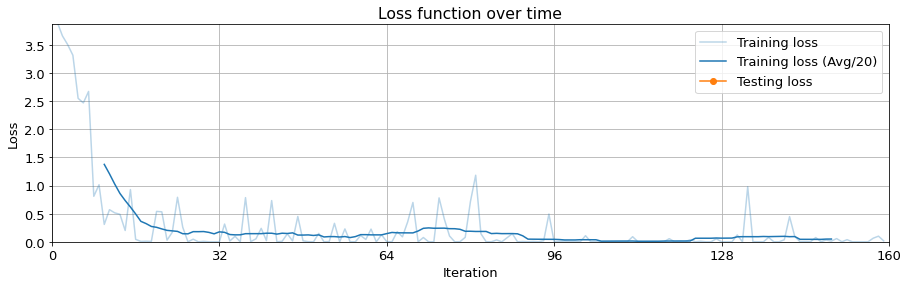

model saved as: results/model_corr_tau_50.pt


In [462]:
from models.tiramisu import DenseUNet
# Taus being tested
taus = [1e-3, 2e-3, 5e-3, 1e-2, 2e-2, 5e-2, 1e-1, 2e-1, 5e-1, 1, 2, 5, 10, 20, 50]
for tau in taus:
    print("TAU:", tau)
    class ModNet(DenseUNet):
        def __init__(self, **args):
            super(ModNet, self).__init__(**args, include_top=False)
            out_channels = self.get_channels_count()[-1]
            self.final_conv = torch.nn.Conv2d(out_channels, latent_channels, 1, bias=False)

        def forward(self, x):
            # Penultimate layer
            L_hat = super(ModNet, self).forward(x)
            # Final convolution
            return self.final_conv(L_hat)

    torch.manual_seed(0)
    modelA = ModNet(in_channels=modA_len, nb_classes=latent_channels, **tiramisu_args).to(device1)
    modelB = ModNet(in_channels=modB_len, nb_classes=latent_channels, **tiramisu_args).to(device2)

    optimizerA = optimiser(modelA.parameters(), **opt_args)
    optimizerB = optimiser(modelB.parameters(), **opt_args)

    modelA = modelA.to(device1)
    modelB = modelB.to(device2)
    torch.manual_seed(0)

    losses = {"train": [], "test": []}
    epoch = 0
    #test() # First round of testing
    for epoch in range(1, epochs+1):
        modelA.train()
        modelB.train()
        for batch_idx, data in enumerate(train_loader):
            # Preparing the batch
            data = data.permute(0, 3, 1, 2)
            dataA = data[:, modA].float().to(device1)
            dataB = data[:, modB].float().to(device2)
            # Reseting the optimizer (gradients set to zero)
            optimizerA.zero_grad()
            optimizerB.zero_grad()

            if equivariance:
                # Applies random 90 degrees rotations to the data (group p4)
                # This step enforces the formula of equivariance: d(f(T(x)), T^{-1}(f(x)))
                # With f(x) the neural network, T(x) a transformation, T^{-1}(x) the inverse transformation
                random_rotA = np.random.randint(4, size=batch_size)
                random_rotB = np.random.randint(4, size=batch_size)
                dataA_p4 = batch_rotate_p4(dataA, random_rotA, device1)
                dataB_p4 = batch_rotate_p4(dataB, random_rotB, device2)

                # Compute the forward pass
                L1 = modelA(dataA_p4)
                L2 = modelB(dataB_p4)

                # Applies the inverse of the 90 degree rotation to recover the right positions
                L1_ungrouped = batch_rotate_p4(L1, -random_rotA, device1)
                L2_ungrouped = batch_rotate_p4(L2, -random_rotB, device2)
            else:
                L1_ungrouped = modelA(dataA)
                L2_ungrouped = modelB(dataB)

            # Computes the loss
            loss = compute_pairwise_loss(
                [L1_ungrouped, L2_ungrouped],
                similarity_fn=sim_func,
                tau=tau,
                device=device1
            )[0].mean()

            # Activation regularization
            if act_l1 > 0.:
                loss += act_l1 * activation_decay([L1, L2], p=1., device=device1)
            if act_l2 > 0.:
                loss += act_l2 * activation_decay([L1, L2], p=2., device=device1)

            # Computing the gradients
            loss.backward()

            # Clipping the the gradients if they are too big
            torch.nn.utils.clip_grad_norm_(modelA.parameters(), grad_norm)
            torch.nn.utils.clip_grad_norm_(modelB.parameters(), grad_norm)
            # Performing the gradient descent
            optimizerA.step()
            optimizerB.step()

            losses["train"].append(loss.item())
            clear_output(wait=True)
            plot_losses(losses, steps, steps_per_epoch)
            plt.show()

        # Testing after each epoch
        #_, similarities = test()
        #clear_output(wait=True)
        #plot_losses(losses, steps, steps_per_epoch)
        #plt.show()

    modelA.eval();
    modelB.eval();

    date = datetime.now().strftime("%Y%d%m_%H%M%S")
    model_path = os.path.join(export_folder, f"model_zurich_{simfuncname}_tau_{tau:06.3f}.pt")
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        torch.save({
            "modelA": modelA,
            "modelB": modelB,
        }, model_path)
    print(f"model saved as: {model_path}")

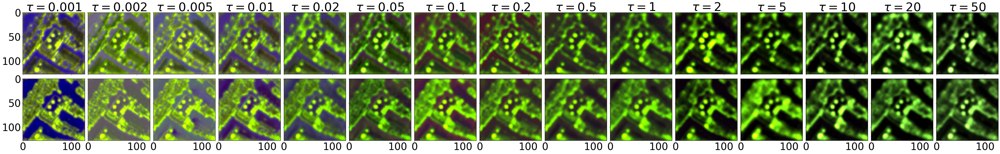

In [30]:
simfuncname = "mse"
import matplotlib as mpl
mpl.rc("font", size=40)
taus = [1e-3, 2e-3, 5e-3, 1e-2, 2e-2, 5e-2, 1e-1, 2e-1, 5e-1, 1, 2, 5, 10, 20, 50]
fig, ax = plt.subplots(2, len(taus), figsize=(len(taus)*4, 8), sharex=True, sharey=True)
L1s, L2s = [], []
for i, tau in tqdm(enumerate(taus)):
    model = torch.load(f"models/model_zurich_{simfuncname}_tau_{tau:06.3f}.pt")
    modelA = model["modelA"].cpu()
    modelA.eval()
    modelB = model["modelB"].cpu()
    modelB.eval();

    
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1s.append(L1)
    L2s.append(L2)

    L1n, L2n = normalize_common(L1, L2)
    ax[0, i].set_title(f"$\\tau={tau}$")
    ax[0, i].imshow(L1n)
    ax[1, i].imshow(L2n)
L1s = np.array(L1s)
L2s = np.array(L2s)

plt.subplots_adjust(0.0, 0.0, 0.9, 0.9, 0.05, 0.05)
plt.savefig(f"results/temperature_{simfuncname}.pdf", bbox_inches="tight", pad_inches=0.0)

In [32]:
# Generating the correlation matrix
C = []
for i in range(15):
    C.append(np.corrcoef(L1s.reshape(15, -1)[i], L2s.reshape(15, -1)[i])[0, 1])

# Bootstrapping
mean = np.mean(C)
means = []
for i in range(100000): # Adjust to your needs
    Cstar = np.random.choice(C, size=15)
    means.append(np.mean(Cstar))

lo, hi = np.percentile(means, [2.5, 97.5])
lo, hi = 2 * mean - np.array([hi, lo])

print(f"Bootstrapped mean pairwise correlation: {mean:.1%} [{lo:.1%}; {hi:.1%}]")

Bootstrapped mean pairwise correlation: 85.4% [83.2%; 88.1%]


# Testing the persistence

In [982]:
# !!! IMPORTANT !!!
# This needs to be re-run every time to test the two differrent settings:
same_seed = True # All models have the same seed if True
same_train_image = True # All moodels have the same training image if True
# Also the name of the saved models needs to be changed.

###### METHOD RELATED
# The place where the models will be saved
export_folder = "results" # Add this path to the .gitignore
# The number of channels in the latent space (best is 1 or 3 for visualization)
latent_channels = 3
# Modality slicing
# You can choose a set of channels per modality (RGB for instance)
# Modality A
modA = slice(0, 3)
modA_name = "RGB"
modA_len = modA.stop - modA.start
# Modality B
modB = slice(3, 4)
modB_name = "NIF"
modB_len = modB.stop - modB.start
# Distance function
simfunctions = {
    "euclidean" : lambda x, y: -torch.norm(x - y, p=2, dim=1).mean(),
    "L1"        : lambda x, y: -torch.norm(x - y, p=1, dim=1).mean(),
    "huber"     : lambda x, y: -torch.sqrt(1 + (x - y).pow(2)).mean(),
    "MSE"       : lambda x, y: -(x - y).pow(2).mean(),
    "L3"        : lambda x, y: -torch.norm(x - y, p=3, dim=1).mean(),
    "Linf"      : lambda x, y: -torch.norm(x - y, p=float("inf"), dim=1).mean(),
    "soft_corr" : lambda x, y: F.softplus(x*y).sum(axis=1),
    "corr"      : lambda x, y: (x*y).sum(axis=1),
    "cosine"    : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).mean(),
    "angular"   : lambda x, y: F.cosine_similarity(x, y, dim=1, eps=1e-8).acos().mean() / math.pi,
}
sim_func = simfunctions["MSE"]
# Temperature (tau) of the loss
tau =  .1
# L1/L2 activation regularization
act_l1 = 0
act_l2 = 0
# p4 Equivariance (should always be True, unless you want to see how everything breaks visually otherwise)
equivariance = True
# Create video (slightly slower training)
video = False
video_path = export_folder

# DEEP LEARNING RELATED
# Device to train on (inference is done on cpu)
device = "cuda" if torch.cuda.is_available() else "cpu"
# Use two GPUs?
device1 = device2 = device # 1 gpu for 2 modalities
#device1, device2 = "cuda:0", "cuda:1" # 1 gpu per modality
# Arguments for the tiramisu neural network
tiramisu_args = {
    # Number of convolutional filters for the first convolution
    "init_conv_filters": 16,
    # Number and depth of down blocks
    "down_blocks": (2, 2, 2),
    # Number and depth of up blocks
    "up_blocks": (2, 2, 2),
    # Number of dense layers in the bottleneck
    "bottleneck_layers": 3,
    # Upsampling type of layer (upsample has no grid artefacts)
    "upsampling_type": "upsample",
    # Type of max pooling, blurpool has better shift-invariance
    "transition_pooling": "max",
    # Dropout rate for the convolution
    "dropout_rate": 0.0,
    # Early maxpooling to reduce the input size
    "early_transition": False,
    # Activation function at the last layer
    "activation_func": None,
    # How much the conv layers should be compressed? (Memory saving)
    "compression": 1.0,
    # Memory efficient version of the tiramisu network (trades memory for computes)
    # Gains of memory are enormous compared to the speed decrease.
    # See: https://arxiv.org/pdf/1707.06990.pdf
    "efficient": False,
}
# Epochs
epochs = 5
# Batch size
batch_size = 24
# Steps per epoch
steps_per_epoch = 32
# Number of steps
steps = steps_per_epoch * epochs
# How many unique patches are fed duriing one epoch
samples_per_epoch = steps_per_epoch * batch_size
# Optimiser
#from lars.lars import LARS
#optimiser = LARS
optimiser = optim.Adam
# Optimizer arguments
opt_args = {
    "lr": 1e-3,
    "weight_decay": 1e-4,
    #"momentum": 0.9
}
# Gradient norm. (limit on how big the gradients can get)
grad_norm = 1.0

# DATASET RELATED
def worker_init_fn(worker_id):
    base_seed = int(torch.randint(2**32, (1,)).item())
    lib_seed = (base_seed + worker_id) % (2**32)
    imgaug.seed(lib_seed)
    np.random.seed(lib_seed)

dataloader_args = {
    "batch_size": batch_size,
    "shuffle": False,
    "num_workers": 16,
    "pin_memory": True,
    "worker_init_fn": worker_init_fn,
}

In [ ]:
from models.tiramisu import DenseUNet
for mdl in range(20):
    print("iteration:", mdl)
    if same_train_image:
        dset = ZurichDataset(f"../zurich/images/zh10.tif", transform=ImgAugTransform())
    else:
        dset = ZurichDataset(f"../zurich/images/zh{mdl}.tif", transform=ImgAugTransform())
    train_loader = torch.utils.data.DataLoader(
        dset,
        sampler=OverSampler(dset, samples_per_epoch),
        **dataloader_args
    )

    class ModNet(DenseUNet):
        def __init__(self, **args):
            super(ModNet, self).__init__(**args, include_top=False)
            out_channels = self.get_channels_count()[-1]
            self.final_conv = torch.nn.Conv2d(out_channels, latent_channels, 1, bias=False)

        def forward(self, x):
            # Penultimate layer
            L_hat = super(ModNet, self).forward(x)
            # Final convolution
            return self.final_conv(L_hat)

    if same_seed:
        torch.manual_seed(0)
    else:
        torch.manual_seed(mdl)
    modelA = ModNet(in_channels=modA_len, nb_classes=latent_channels, **tiramisu_args).to(device1)
    modelB = ModNet(in_channels=modB_len, nb_classes=latent_channels, **tiramisu_args).to(device2)

    optimizerA = optimiser(modelA.parameters(), **opt_args)
    optimizerB = optimiser(modelB.parameters(), **opt_args)

    modelA = modelA.to(device1)
    modelB = modelB.to(device2)
    torch.manual_seed(0)

    losses = {"train": [], "test": []}
    epoch = 0
    #test() # First round of testing
    for epoch in range(1, epochs+1):
        modelA.train()
        modelB.train()
        for batch_idx, data in enumerate(train_loader):
            # Preparing the batch
            data = data.permute(0, 3, 1, 2)
            dataA = data[:, modA].float().to(device1)
            dataB = data[:, modB].float().to(device2)
            # Reseting the optimizer (gradients set to zero)
            optimizerA.zero_grad()
            optimizerB.zero_grad()

            if equivariance:
                # Applies random 90 degrees rotations to the data (group p4)
                # This step enforces the formula of equivariance: d(f(T(x)), T^{-1}(f(x)))
                # With f(x) the neural network, T(x) a transformation, T^{-1}(x) the inverse transformation
                random_rotA = np.random.randint(4, size=batch_size)
                random_rotB = np.random.randint(4, size=batch_size)
                dataA_p4 = batch_rotate_p4(dataA, random_rotA, device1)
                dataB_p4 = batch_rotate_p4(dataB, random_rotB, device2)

                # Compute the forward pass
                L1 = modelA(dataA_p4)
                L2 = modelB(dataB_p4)

                # Applies the inverse of the 90 degree rotation to recover the right positions
                L1_ungrouped = batch_rotate_p4(L1, -random_rotA, device1)
                L2_ungrouped = batch_rotate_p4(L2, -random_rotB, device2)
            else:
                L1_ungrouped = modelA(dataA)
                L2_ungrouped = modelB(dataB)

            # Computes the loss
            loss = compute_pairwise_loss(
                [L1_ungrouped, L2_ungrouped],
                similarity_fn=sim_func,
                tau=tau,
                device=device1
            )[0].mean()

            # Activation regularization
            if act_l1 > 0.:
                loss += act_l1 * activation_decay([L1, L2], p=1., device=device1)
            if act_l2 > 0.:
                loss += act_l2 * activation_decay([L1, L2], p=2., device=device1)

            # Computing the gradients
            loss.backward()

            # Clipping the the gradients if they are too big
            torch.nn.utils.clip_grad_norm_(modelA.parameters(), grad_norm)
            torch.nn.utils.clip_grad_norm_(modelB.parameters(), grad_norm)
            # Performing the gradient descent
            optimizerA.step()
            optimizerB.step()

            #losses["train"].append(loss.item())
            #clear_output(wait=True)
            #plot_losses(losses, steps, steps_per_epoch)
            #plt.show()

        # Testing after each epoch
        #_, similarities = test()
        #clear_output(wait=True)
        #plot_losses(losses, steps, steps_per_epoch)
        #plt.show()

    modelA.eval();
    modelB.eval();

    date = datetime.now().strftime("%Y%d%m_%H%M%S")
    model_path = os.path.join(export_folder, f"model_zurich_persist_{mdl:02d}.pt")
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        torch.save({
            "modelA": modelA,
            "modelB": modelB,
        }, model_path)
    print(f"model saved as: {model_path}")

In [35]:
L1s_fw_fi, L2s_fw_fi = [], [] # Fixed Weight (fw), Fixed Image (fi)
L1s_dw_fi, L2s_dw_fi = [], [] # Different Weights (dw), Fixed Image (fi)
L1s_fw_di, L2s_fw_di = [], [] # Fixed Weight (fw), Different train Image (di)
L1s_dw_di, L2s_dw_di = [], [] # Different Weights (dw), Different train Image (di)

for i in tqdm(range(50)):
    model = torch.load(f"models/model_zurich_persist_fw_fi_{i:02d}.pt") # Fixed weights, 1 train image
    modelA = model["modelA"].cpu()
    modelA.eval()
    modelB = model["modelB"].cpu()
    modelB.eval();
    
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1s_fw_fi.append(L1)
    L2s_fw_fi.append(L2)
L1s_fw_fi = np.array(L1s_fw_fi)
L2s_fw_fi = np.array(L2s_fw_fi)

for i in tqdm(range(20)):
    model = torch.load(f"models/model_zurich_persist_dw_fi_{i:02d}.pt")  # Rand weights, 1 train image
    modelA = model["modelA"].cpu()
    modelA.eval()
    modelB = model["modelB"].cpu()
    modelB.eval();
    
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1s_dw_fi.append(L1)
    L2s_dw_fi.append(L2)
L1s_dw_fi = np.array(L1s_dw_fi)
L2s_dw_fi = np.array(L2s_dw_fi)

for i in tqdm(range(20)):
    model = torch.load(f"models/model_zurich_persist_fw_di_{i:02d}.pt") # Fixed weights, 1 image per nn
    modelA = model["modelA"].cpu()
    modelA.eval()
    modelB = model["modelB"].cpu()
    modelB.eval();
    
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1s_fw_di.append(L1)
    L2s_fw_di.append(L2)
L1s_fw_di = np.array(L1s_fw_di)
L2s_fw_di = np.array(L2s_fw_di)

for i in tqdm(range(20)):
    model = torch.load(f"models/model_zurich_persist_dw_di_{i:02d}.pt") # Rand weights, 1 image per nn
    modelA = model["modelA"].cpu()
    modelA.eval()
    modelB = model["modelB"].cpu()
    modelB.eval();
    
    patchA = get_patch(img[..., modA], 610, 150, 0)
    patchB = get_patch(img[..., modB], 610, 150, 0)
    dataA = torch.tensor(patchA[np.newaxis].transpose(0, 3, 1, 2), device="cpu")
    dataB = torch.tensor(patchB[np.newaxis].transpose(0, 3, 1, 2), device="cpu")

    L1 = modelA(dataA).detach().numpy()[0].transpose(1, 2, 0)
    L2 = modelB(dataB).detach().numpy()[0].transpose(1, 2, 0)
    L1s_dw_di.append(L1)
    L2s_dw_di.append(L2)
L1s_dw_di = np.array(L1s_dw_di)
L2s_dw_di = np.array(L2s_dw_di)

In [36]:
i = 0
np.random.seed(0)
for Rs in [
    (L1s_fw_fi, L2s_fw_fi, "fw_fi"),
    (L1s_dw_fi, L2s_dw_fi, "dw_fi"),
    (L1s_fw_di, L2s_fw_di, "fw_di"),
    (L1s_dw_di, L2s_dw_di, "dw_di")]:
    name = Rs[2]
    rhosm1 = []
    rhosm2 = []
    for j in range(1000):
        R1 = Rs[0].reshape(Rs[0].shape[0], -1)
        R2 = Rs[1].reshape(Rs[1].shape[0], -1)
        if i > 1:
            R1 = np.delete(R1, 11, 0)
            R2 = np.delete(R2, 11, 0)
        N = R1.shape[0]
        idx = np.random.choice(R1.shape[0], size=N)
        R1 = R1[idx]
        idx = np.random.choice(R1.shape[0], size=N)
        R2 = R2[idx]
        rhos1 = np.tril(np.corrcoef(R1), -1).ravel()
        rhos1 = rhos1[rhos1 != 0.0]
        rhos2 = np.tril(np.corrcoef(R2), -1).ravel()
        rhos2 = rhos2[rhos2 != 0.0]
        rhosm1.append(np.mean(rhos1))
        rhosm1.append(np.mean(rhos2))
    
    R1 = Rs[0].reshape(Rs[0].shape[0], -1)
    R2 = Rs[1].reshape(Rs[1].shape[0], -1)
    if i > 1:
        R1 = np.delete(R1, 11, 0)
        R2 = np.delete(R2, 11, 0)
    N = R1.shape[0]
    rhos1 = np.tril(np.corrcoef(R1), -1).ravel()
    rhos1 = rhos1[rhos1 != 0.0]
    rhos2 = np.tril(np.corrcoef(R2), -1).ravel()
    rhos2 = rhos2[rhos2 != 0.0]
    rho = .5 * (np.mean(rhos1) + np.mean(rhos2))
    rhoci = 2 * rho - np.array(np.percentile(rhosm1, [97.5, 2.5]))
    print(f"{name}: {rho: 4.1%} (95% C.I.: [{rhoci[0]: 4.1%}; {rhoci[1]: 4.1%}], N={2*N})")
    i += 1

fw_fi:  93.0% (95% C.I.: [ 90.6%;  95.5%], N=100)
dw_fi: -2.7% (95% C.I.: [-21.0%; -1.3%], N=40)
fw_di:  78.4% (95% C.I.: [ 70.6%;  83.8%], N=38)
dw_di:  1.9% (95% C.I.: [-18.5%;  5.9%], N=38)


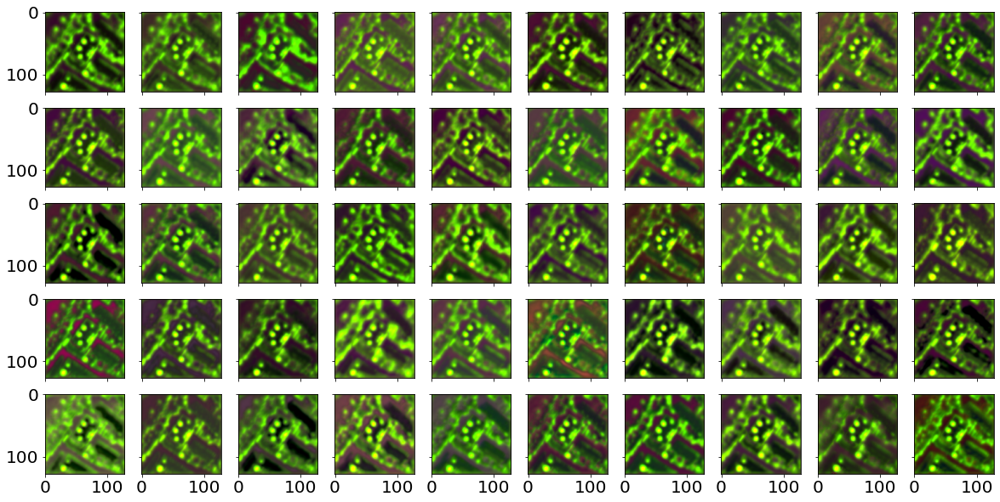

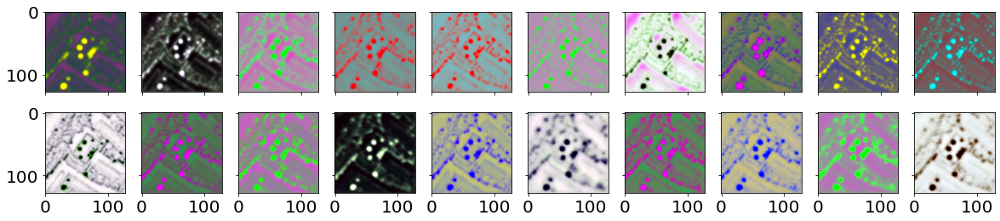

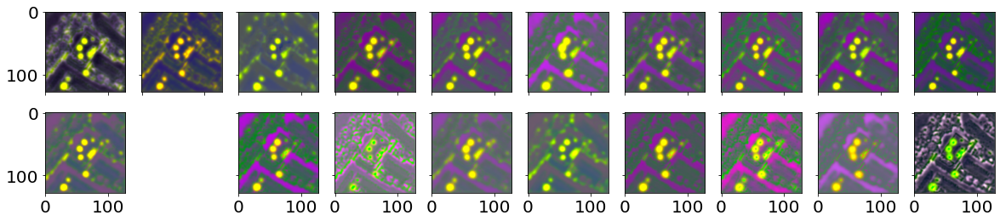

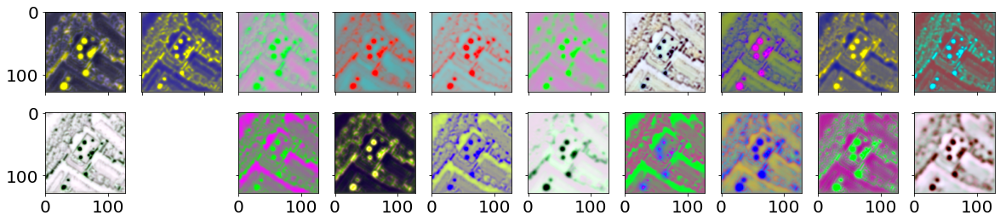

In [443]:
mpl.rc("font", size=20)
j = 0
for Rs in [
    (L1s_fw_fi, L2s_fw_fi, "fw_fi"),
    (L1s_dw_fi, L2s_dw_fi, "dw_fi"),
    (L1s_fw_di, L2s_fw_di, "fw_di"),
    (L1s_dw_di, L2s_dw_di, "dw_di")]:
    R1, R2, tp = Rs
    N = R1.shape[0]
    rows = int(np.ceil(N / 10))
    fig, axs = plt.subplots(rows, 10, figsize=(20, 2*rows), sharex=True, sharey=True)
    axs = axs.ravel()
    for i in range(len(axs)):
        if j > 1 and i == 11:
            fig.delaxes(axs[i])
            continue
        
        L1n, L2n = normalize_common(R1[i], R2[i])
        axs[i].imshow(L1n)
    plt.savefig(f"results/embeddings_{tp}.pdf", bbox_inches='tight', pad_inches=0.10)
    j += 1